<a href="https://colab.research.google.com/github/ImanLiao/tensorflow/blob/master/body_landmark_detection_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

This notebook is authored by Dr. Iman Yi Liao. The main objective is to test code modification I will have made to the code that my FYP student Eric has done based on the original FashionNet models. There are several modifications I attempt to do, which are detailed as follows.


## Option 1 

A simple modification at the output layer where the number of heatmaps is not kept as 8 (as in the origianl FashionNet). Instead, the number of heatmaps will be created according to the dataset at hand. [*Basic implementation is done. Other options that can be implemented include changing the number of channels of previous layers other than just that of the output layer.*]


## Option 2

Design a plug-in network (e.g., GMM) where image feature maps are the input to the plug-in network and the output would be parameters to be evaluated that are specific to a particular input image. The parameters are then applied to image features to produce dedicated transformed features such as GMM map. These GMM maps are then combined with other image features to be further processed to produce landmark heatmaps. Such plug-in network is conceptually similar to Spatial Transformer Network (STN) and Attentional Unit but is to implement any intermediate process that may boost/regularise the performance of the entire network.

![Using GMM Plug-in](https://drive.google.com/uc?export=view&id=1v9bHjj26h2eiz93xs7_kV7Z-lkFPAGB4)


## Option 3

Use Fashion Landmark detection to regulate/attend the body landmark detection. This version has been implemented and tested. 

The vanilla model, designed under **Option 1**, adopts the feature extraction and landmark detection branch in DeepFashion Net, and replaces its last heatmap output with a heatmap layer that matches the body landmarks. We froze the feature extraction block and re-trained landmark branch for the vanilla model. 

Under **Option 3**, we design a model with attention unit. It adopts the feature extraction, landmark detection branch, as well as the attention unit in the DeepFashion Net, and replaces the rest with a body landmark detection branch that has similar architecture to that of the original fashion landmark branch. We froze the feature extraction block and the fashion landmark branch, and trained the attention unit and body landmark branch. Both vanilla model and attention model were trained with data augmentations.

Experimental results show that the validation error in terms of average landmark distance between predicted landmarks and the ground-truth, is 0.033 and 0.023 for the vanilla model and the attention model, respectively, which are around 38% and 57% respectively lower than that was reported by the DeepFashion Net (0.0534). Furthermore, the attention model produced 30% validation error reduction compared to that of the vanilla model. It demonstrated that the attention unit, designed to focus body landmark detection on areas around fashion landmarks, is efficient.

![Using Fashion landmarks to regulate or attend body landmarks detection](https://drive.google.com/uc?export=view&id=1EKNYbdL-Yaz8scDe2PKb5Gb7fXM40mEh)


## Option 4

Multi-scale DCNN network for high resolution landmarks detection. 

One possible multi-scale architecture desgin is shown below, where the low resoltuion branch will already have been trained through e.g., option 1, option 2, or option 3 and therefore is frozen and not trainable. The outputs at different levels in the low resolution branch are upsampled to be combined with the corresponding levels in the high resolution branch, either by channel-wise concatination (i.e., feature concatination), or element-wise multiplication (i.e., attention). The upsampling layers from the low resolution branch to the high resolution branch are trainable. The architecture of the entire high resolution branch is similar to that of the low resolution one, i.e., feature extraction + landmark detection, and is fully trainable. 

In fact, since all layers in the low/high resolution branch are convolutional layers, it is then possible to initialise the weights in high resolution branch with the weights of trained low resolution branch.

A simpler design could be just using the archicture of the low resolution branch but re-train it with high resolution images/landmarks.

![Multi-scale](https://drive.google.com/uc?export=view&id=1VXiNbFLQY7GoQiBIyEfR3E5gvTT08fJj)


# Hardware/Software Setup

## Mont Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


Remount the drive if necessary.

In [ ]:
drive.mount("/content/gdrive", force_remount=True)

Mounted at /content/gdrive


In [ ]:
! ls

gdrive	sample_data


## Access the projects folder under mydrive

In [ ]:
%cd /content/gdrive/My Drive/Projects/BodyLandmarkDetection

/content/gdrive/My Drive/Projects/BodyLandmarkDetection


## Install tensorboard

In [ ]:
% pip install tensorboardX

     |████████████████████████████████| 317kB 3.3MB/s 


## Install Torch graph visualisation tool

In [ ]:
! pip install torchviz

     |████████████████████████████████| 51kB 2.5MB/s 
  Created wheel for torchviz: filename=torchviz-0.0.1-cp36-none-any.whl size=3523 sha256=a4fea067d35b01439f2e70018257551569a2aa4b7d448dbec5430d9d98353190
  Stored in directory: /root/.cache/pip/wheels/2a/c2/c5/b8b4d0f7992c735f6db5bfa3c5f354cf36502037ca2b585667
Successfully built torchviz


# Option 0 (8 landmarks)

In [ ]:
! python custlrexpanded_experiment_run_v2.py

# Option 1 (12 landmarks)

## Check the model output by running some samples.

Import all the necessary modules.

In [ ]:
import torch
import time
import pandas as pd
from modelclass_v2 import LandmarkExpNetwork as LMNET
from custlrloader import CustlrDataset
from torch.utils.data import DataLoader
from tensorboardX import SummaryWriter
from matplotlib import pyplot as plt
import src.const as const
from src.utils_v2 import LandmarkEvaluator as _evaluator


Set values for parameters such as path and files to load.

In [ ]:
trainstartparam=26
traincsv='dataset/custlr/auged/train.csv'
valcsv='dataset/custlr/auged/val.csv'
base_path = 'dataset/custlr/auged/'
experiment=''


Load  dataset.

In [ ]:
#load dataset
traindf = pd.read_csv(traincsv)
valdf = pd.read_csv(valcsv)
    
train_dataset = CustlrDataset(traindf, mode='RANDOM', base_path=base_path)
val_dataset = CustlrDataset(valdf, mode='LARGESTCENTER', base_path=base_path)
    
print('training set', len(train_dataset))
print('val set', len(val_dataset))
dssize = len(train_dataset)+len(val_dataset)
    
trainloader = DataLoader(train_dataset, batch_size=10, shuffle=True, num_workers=4)
valloader = DataLoader(val_dataset, batch_size=10, shuffle=True, num_workers=4)


training set 8960
val set 2100


Inspect the image shape in the train dataset.

In [ ]:
#train_dataset[0]['image'].shape
train_dataset[0]['image'].size()

torch.Size([3, 224, 224])

Load the model for transfer learning.

In [ ]:
#when load empty model, make sure to set the number of landmark maps as the output channel of the model
out_channel = train_dataset[0]['landmark_map'].shape[0]
print(out_channel)

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
#load empty model
model = LMNET(out_channel)
learning_rate = 0.0001
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
statedict = torch.load('models/lmfulltrain.pkl')

evaluator = _evaluator(out_channel)

# load model state to vgg16_extractor only and randomly initialise the weights for weights in lm_branch
for child_name, child in model.named_children():
  if child_name == 'vgg16_extractor':
    for para_name, param in child.named_parameters():
      param = statedict[child_name + '.'+ para_name]
  elif child_name == 'lm_branch':
    for para_name, param in child.named_parameters():
      if 'bias' in para_name:
        torch.nn.init.constant(param, 0) # initialise bias with zeros
      else:
        print(para_name)
        torch.nn.init.xavier_uniform(param) #initialise linear weights with Kaiming/Xavier uniform weights

for i, param in enumerate(model.parameters()):
  if i >= trainstartparam:
    break
  param.requires_grad = False
    
k=trainstartparam
for name, param in model.named_parameters():
  if param.requires_grad:
    print(k,name)
    k=k+1

model.to(device)


Check the output with only one batch of sample data.

In [ ]:
for i, sample in enumerate(trainloader):
  if i >= 1:
    break
  for key in sample:
    sample[key] = sample[key].to(device)
  output = model(sample)
  print(output['lm_pos_map'].shape)

Check the mask shape in the sample data.

In [ ]:
print(sample['landmark_map224'].shape)

## Now train the model with Custlr dataset.

Train with the datasets of 12 landmarks.

In [ ]:
import transfertraining_function_v2 as tff
train_pos_loss, val_pos_loss = tff.starttraining(traincsv='dataset/custlr/auged/train12lm.csv',valcsv='dataset/custlr/auged/val12lm.csv',experiment='custlrexpanded_models/')


training set 8960
val set 2100
conv1.weight
conv2.weight
conv3.weight
conv4.weight
upconv1.weight
conv5.weight
conv6.weight
upconv2.weight
conv7.weight
conv8.weight
upconv3.weight
conv9.weight
conv10.weight
LandmarkExpNetwork(
  (vgg16_extractor): VGG16Extractor(
    (vgg): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)


/content/gdrive/My Drive/Projects/BodyLandmarkDetection/transfertraining_function_v2.py:60: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  torch.nn.init.xavier_uniform(param) #initialise linear weights with Kaiming/Xavier uniform weights
/content/gdrive/My Drive/Projects/BodyLandmarkDetection/transfertraining_function_v2.py:57: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  torch.nn.init.constant(param, 0) # initialise bias with zeros


Streaming output truncated to the last 5000 lines.
EPOCH: 13 / 20 step: 625 / 896 | lm position loss: 0.00014049472520127892  | weighted loss: 0.0014049472520127892
EPOCH: 13 / 20 step: 626 / 896 | lm position loss: 0.00014171576185617596  | weighted loss: 0.0014171576185617596
EPOCH: 13 / 20 step: 627 / 896 | lm position loss: 0.00015031160728540272  | weighted loss: 0.0015031160728540272
EPOCH: 13 / 20 step: 628 / 896 | lm position loss: 0.00013275940727908164  | weighted loss: 0.0013275940727908164
EPOCH: 13 / 20 step: 629 / 896 | lm position loss: 0.00018751552852336317  | weighted loss: 0.0018751552852336317
EPOCH: 13 / 20 step: 630 / 896 | lm position loss: 0.00011840773368021473  | weighted loss: 0.0011840773368021473
EPOCH: 13 / 20 step: 631 / 896 | lm position loss: 0.00016261891869362444  | weighted loss: 0.0016261891869362444
EPOCH: 13 / 20 step: 632 / 896 | lm position loss: 0.00012834745575673878  | weighted loss: 0.0012834745575673878
EPOCH: 13 / 20 step: 633 / 896 | lm p

## Visualise the reulsts with TensorboardX

In [ ]:
! tensorboard --logdir runs/ 

(Note that the above code didn't work with localhost!!!)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# Option 2: Incorporating Spatial Transformer Network

## Architecture Design

We incorporate Spatial Transformer Network in the model 

![Multi-scale](https://drive.google.com/uc?export=view&id=1bsChxWzOKjFk4UslfrBhIV3xovNH6Re9)

## Implementation Details

### Choice of Sptial Transformation

We assume that the human body landmarks lie on a 3D plane, i.e., the 3D landmakrs are co-planar. This 3D plane would then undergo a series of 
spatial transformations including scaling, rotation, translation, and perspective projection, to form the image that has been observed. That is to say, the intermediate output of the STN contains parameters for those spatial transformations. The output of the STN is a set of sampling points as the results of spatial transformations of a regular sampling grid.

#### Check the implementation of STN using torch.nn.functional.affine_grid and torch.nn.functional.grid_sample

Load an example image

In [17]:
import torch
import torch.nn.functional as F
import torch.nn as nn
import numpy as np

from scipy.misc import face
import matplotlib.pyplot as plt

In [18]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

In [19]:
np_image = face()
print(type(np_image), np_image.shape)
tensor_image = torch.from_numpy(np_image).to(device)
print(type(tensor_image), tensor_image.shape)

<class 'numpy.ndarray'> (768, 1024, 3)
<class 'torch.Tensor'> torch.Size([768, 1024, 3])


<class 'torch.Tensor'> torch.Size([3, 768, 1024])
<class 'torch.Tensor'> torch.Size([768, 1024, 3])


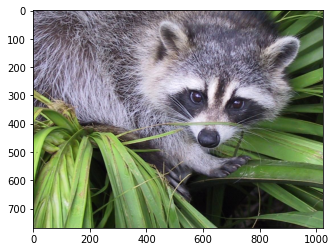

In [20]:
# reshape to channel first:
# tensor_image = tensor_image.view(tensor_image.shape[2], tensor_image.shape[0], tensor_image.shape[1])
tensor_image = tensor_image.permute(2, 0, 1)
print(type(tensor_image), tensor_image.shape)

img = tensor_image.permute(1, 2, 0)
print(type(img), img.shape)
plt.imshow(img.cpu())
plt.show()

In [ ]:
tensor_image_batch = torch.zeros([1, tensor_image.shape[0], tensor_image.shape[1], tensor_image.shape[2]]).to(device)
tensor_image_batch[0] = tensor_image

tensor_image_batch = F.interpolate(tensor_image_batch, (64, 86)) # resize 768x2014 to 64x86

print(type(tensor_image_batch), tensor_image_batch.shape)

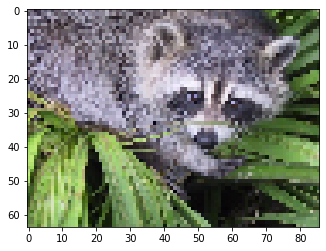

In [22]:
img = tensor_image_batch[0]
plt.imshow(img.permute(1, 2, 0).cpu()/255)
plt.show()

Randomly generate an affine matrix, e.g., rotation by 45 degrees

In [110]:
import math

pi = math.pi

scaling_matrix = torch.tensor([[0.5, 0, 0],[0, 0.5, 0],[0, 0, 1]]).to(device)
rotation_matrix = torch.tensor([[math.cos(pi/4), math.sin(pi/4), 0], [-math.sin(pi/4), math.cos(pi/4), 0]]).to(device)
affine_matrix_0 = torch.matmul(rotation_matrix, scaling_matrix)
affine_matrix = torch.zeros([1, 2, 3]).to(device)
affine_matrix[0] = affine_matrix_0
print(type(affine_matrix), affine_matrix.shape)

<class 'torch.Tensor'> torch.Size([1, 2, 3])


Apply affine_grid to obtain sampler

In [111]:
affine_flow = F.affine_grid(affine_matrix, tensor_image_batch.shape, align_corners=False)
#affine_flow = F.affine_grid(affine_matrix, [1, 3, int(768/2), int(1024/2)], align_corners=False)
#print(affine_flow.shape, affine_flow)
print(torch.max(affine_flow))

tensor(0.6975, device='cuda:0')


In [112]:
affine_flow_normalised = (affine_flow - torch.min(affine_flow))/(torch.max(affine_flow) - torch.min(affine_flow)) * 2 - 1

Apply grid_sample to the example image and visualise it

<class 'torch.Tensor'> torch.Size([64, 86, 3])


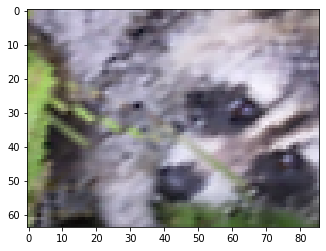

<class 'torch.Tensor'> torch.Size([64, 86, 3])


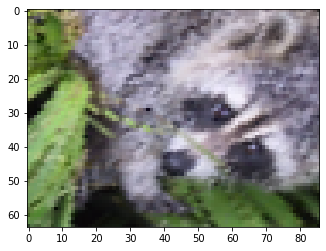

In [113]:
tensor_image_batch_transformed = F.grid_sample(tensor_image_batch, affine_flow, align_corners=False)
tensor_image_batch_transformed_normalised = F.grid_sample(tensor_image_batch, affine_flow_normalised, align_corners=False)

img = tensor_image_batch_transformed[0]
img = img.permute(1, 2, 0)
print(type(img), img.shape)

plt.imshow(img.cpu()/255)
plt.show()

img = tensor_image_batch_transformed_normalised[0]
img = img.permute(1, 2, 0)
print(type(img), img.shape)

plt.imshow(img.cpu()/255)
plt.show()

Now apply grid_sample to the output of the previous step and visualise it

<class 'torch.Tensor'> torch.Size([64, 86, 3])


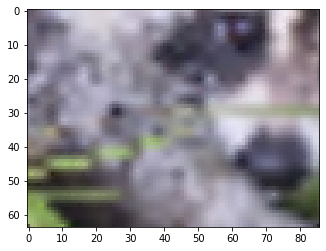

In [27]:
inverse_affine_matrix = torch.tensor([[[math.cos(-pi/4), math.sin(-pi/4), -0.5], [-math.sin(-pi/4), math.cos(-pi/4), -0.2]]]).to(device)
inverse_affine_flow = F.affine_grid(inverse_affine_matrix, tensor_image_batch.shape, align_corners=False)
inverse_affine_flow = (inverse_affine_flow - torch.min(inverse_affine_flow))/(torch.max(inverse_affine_flow) - torch.min(inverse_affine_flow)) * 2 - 1

tensor_image_batch_reversed = F.grid_sample(tensor_image_batch_transformed, inverse_affine_flow, align_corners=False)

img = tensor_image_batch_reversed[0]
img = img.permute(1, 2, 0)
print(type(img), img.shape)

plt.imshow(img.cpu()/255)
plt.show()

In [40]:
print(affine_flow.view((-1,2)).shape)

torch.Size([786432, 2])


#### Develop my own image warping function based on the output of affine_grid

The following defines a kernel map function for single stimulus (i.e., single position from an input image).

In [26]:
def fnKernelMap(pulse_pos, output_image_size, device='cuda:0'):
  '''
  Generate a kernel map that has the same size of the output_image_size based on the single input pulse position

  Input:
    pulse_pos: (y, x) where y is row and x is column, float type.
    output_image_size: (H, W), H is the image height and W the image width
  
  Return:
    kernel_map: H x W
  '''

  # We use gaussian kernel here
  device_used = torch.device(device) if torch.cuda.is_available() else torch.device('cpu')

  sigma_x = 1.
  sigma_y = 1.

  y = torch.from_numpy(np.arange(output_image_size[0])).to(device_used)
  x = torch.from_numpy(np.arange(output_image_size[1])).to(device_used)
  y_grid, x_grid = torch.meshgrid(y, x)
  #print(x_grid.shape)

  kernel_map_h = torch.exp(-(pulse_pos[0] - y_grid) * (pulse_pos[0] - y_grid) / (2*sigma_y*sigma_y))
  kernel_map_w = torch.exp(-(pulse_pos[1] - x_grid) * (pulse_pos[1] - x_grid) / (2*sigma_x*sigma_x))
  kernel_map = kernel_map_h * kernel_map_w

  return kernel_map

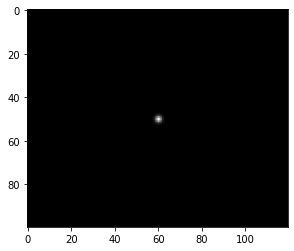

In [27]:
kernel_map = fnKernelMap([50, 60], [100, 120])
plt.imshow(kernel_map.cpu()/torch.max(kernel_map), cmap='gray')
plt.show()

Define a function that avoids using for loops as much as possible by taking the advantange of tensor operations. This function should be used in the implementation of **LRM-STN** model. 

In [114]:
def fnImageWarping(input_images, affine_grid, output_image_size, device='cuda:0'):
  '''
  Input:
    input_images: size N x C x H x W, N: number of images in the batch, C: number of channels, H: image height, W: image width
    affine_grid: the output of using torch.nn.functional.affine_grid, the range should be between -1 and 1 for both height and width, size: N x H x W x 2
    output_image_size: (H', W'), H': output image height, W': output image width
  
  Return: 
    output_images: size N x C x H' x W'
  '''

  device_used = torch.device(device) if torch.cuda.is_available() else torch.device('cpu')

  # We use gaussian kernel here
  sigma_w = 1.
  sigma_h = 1.

  h = torch.from_numpy(np.arange(output_image_size[0])).to(device_used)
  w = torch.from_numpy(np.arange(output_image_size[1])).to(device_used)
  h_grid, w_grid = torch.meshgrid(h, w) # both are of size H' x W'
  h_grid = h_grid.repeat(input_images.shape[2] * input_images.shape[3], 1)
  h_grid = h_grid.reshape(input_images.shape[2] * input_images.shape[3], -1, h_grid.shape[1]) # size (H*W) x H' x W'
  w_grid = w_grid.repeat(input_images.shape[2] * input_images.shape[3], 1)
  w_grid = w_grid.reshape(input_images.shape[2] * input_images.shape[3], -1, w_grid.shape[1]) # size (H*W) x H' x W'

  output_images = torch.zeros((input_images.shape[0], input_images.shape[1], output_image_size[0], output_image_size[1])).to(device_used)
  for n in range(len(input_images)):
    # Align the index of input images with that of the input affine grid, and reshape image to long verctor per channel, i.e., size C x (H*W)
    img = torch.flip(input_images[n], [2]).view(input_images[n].shape[0], -1) 
    input_grid = affine_grid[n]
    input_grid = input_grid.permute(2, 0, 1) # change the grid to shape 2 x H x W

    # convert the grid values to match the output image size
    input_grid = input_grid.view(2, -1)
    input_grid[0] = (input_grid[0] - (-1)) * output_image_size[0] / 2
    input_grid[1] = (input_grid[1] - (-1)) * output_image_size[1] / 2
    input_grid = input_grid.transpose(0, 1)
    # structure the grid into tensor
    input_grid = input_grid.reshape(input_grid.shape[0], -1, 1)
    input_grid = input_grid.repeat(1, 1, output_image_size[0] * output_image_size[1])
    input_grid = input_grid.reshape(input_grid.shape[0], input_grid.shape[1], output_image_size[0], output_image_size[1]) # size of (H*W) x 2 x H' x W'
    input_grid = input_grid.permute(1, 0, 2, 3) # size 2 x (H*W) x H' x W'
    # compute the kernel map
    kernel_map_h = torch.exp(-(input_grid[0] - h_grid) * (input_grid[0] - h_grid) / (2*sigma_h*sigma_h))
    kernel_map_w = torch.exp(-(input_grid[1] - w_grid) * (input_grid[1] - w_grid) / (2*sigma_w*sigma_w))
    kernel_map = kernel_map_h * kernel_map_w # size (H*W) x H' x W'

    for c in range(len(img)):
      # img[c] is of size (H*W) and reshape it to (H*W) x 1 x 1 so it is broadcastable with kernel_map of size (H*W) x H' x W'
      output_images[n][c] = torch.sum(torch.mul(img[c].reshape(len(img[c]), 1, 1), kernel_map), 0) # sum over all pixels of input images, i.e., summation along dimension 0

  return output_images


In [115]:
print(torch.max(affine_flow))

tensor(0.6975, device='cuda:0')


<class 'torch.Tensor'> torch.Size([64, 86, 3]) tensor(5970.1240, device='cuda:0') tensor(0., device='cuda:0')


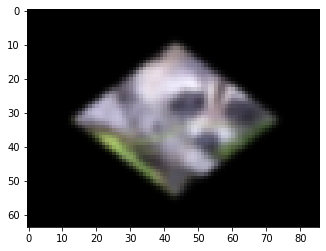

In [116]:
tensor_image_batch_reversed = fnImageWarping(tensor_image_batch_transformed, affine_flow, tensor_image_batch.shape[2:])

img = tensor_image_batch_reversed[0]
img = img.permute(1, 2, 0)
print(type(img), img.shape, torch.max(img), torch.min(img))

plt.imshow(img.cpu()/torch.max(img))
plt.show()

#### Components of Spatial Transformations

In [2]:
import torch
import torch.nn.functional as F
import torch.nn as nn
import numpy as np

from scipy.misc import face
import matplotlib.pyplot as plt

In [3]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

In [4]:
np_image = face()
print(type(np_image), np_image.shape)
tensor_image = torch.from_numpy(np_image).to(device)
print(type(tensor_image), tensor_image.shape)

<class 'numpy.ndarray'> (768, 1024, 3)


/pytorch/torch/csrc/utils/tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.


<class 'torch.Tensor'> torch.Size([768, 1024, 3])


<class 'torch.Tensor'> torch.Size([3, 768, 1024])
<class 'torch.Tensor'> torch.Size([768, 1024, 3])


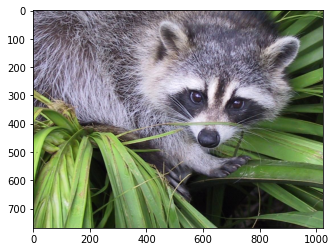

In [5]:
# reshape to channel first:
# tensor_image = tensor_image.view(tensor_image.shape[2], tensor_image.shape[0], tensor_image.shape[1])
tensor_image = tensor_image.permute(2, 0, 1)
print(type(tensor_image), tensor_image.shape)

img = tensor_image.permute(1, 2, 0)
print(type(img), img.shape)
plt.imshow(img.cpu())
plt.show()

In [6]:
tensor_image_batch = torch.zeros([1, tensor_image.shape[0], 1, tensor_image.shape[1], tensor_image.shape[2]]).to(device) #size N x C x D x H x W
tensor_image_batch = tensor_image_batch.permute(0, 2, 1, 3, 4) #size N x D x C x H x W
tensor_image_batch[0][0] = tensor_image
tensor_image_batch = tensor_image_batch.permute(0, 2, 1, 3, 4) #size N x C x D x H x W

#tensor_image_batch = F.interpolate(tensor_image_batch, (64, 86)) # resize 768x2014 to 64x86

print(type(tensor_image_batch), tensor_image_batch.shape)

<class 'torch.Tensor'> torch.Size([1, 3, 1, 768, 1024])


##### 3D scaling

In [7]:
import math

pi = math.pi

s_x = 0.8
s_y = 0.6
s_z = 1
scaling_matrix = torch.tensor([[s_x, 0, 0, 0],[0, s_y, 0, 0], [0, 0, s_z, 0], [0, 0, 0, 1]]).to(device)
print(scaling_matrix)

tensor([[0.8000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.6000, 0.0000, 0.0000],
        [0.0000, 0.0000, 1.0000, 0.0000],
        [0.0000, 0.0000, 0.0000, 1.0000]], device='cuda:0')


##### 3D rotation

In [24]:
theta_x = pi/4
theta_y = pi/5
theta_z = pi/6
rotation_matrix_x = torch.tensor([[1., 0., 0., 0.], [0, math.cos(theta_x), math.sin(theta_x), 0], [0., -math.sin(theta_x), math.cos(theta_x), 0], [0., 0., 0., 1]]).to(device)
rotation_matrix_y = torch.tensor([[math.cos(theta_y), 0., math.sin(theta_y), 0.], [0, 1, 0, 0], [-math.sin(theta_y), 0., math.cos(theta_y), 0], [0., 0., 0., 1]]).to(device)
rotation_matrix_z = torch.tensor([[math.cos(theta_z), math.sin(theta_z), 0, 0], [-math.sin(theta_z), math.cos(theta_z), 0, 0], [0, 0, 1, 0], [0., 0., 0., 1]]).to(device)
rotation_matrix = torch.matmul(torch.matmul(rotation_matrix_x, rotation_matrix_y), rotation_matrix_z)

print(rotation_matrix)

tensor([[ 0.7006,  0.4045,  0.5878,  0.0000],
        [-0.7135,  0.4046,  0.5721,  0.0000],
        [-0.0064, -0.8202,  0.5721,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  1.0000]], device='cuda:0')


##### 3D translation

In [25]:
t_x = 0.5
t_y = 0.5
t_z = 0.5
translation_matrix = torch.tensor([[1, 0, 0, t_x], [0, 1, 0, t_y],[0, 0, 1, t_z], [0, 0, 0, 1]]).to(device)

print(translation_matrix)

tensor([[1.0000, 0.0000, 0.0000, 0.5000],
        [0.0000, 1.0000, 0.0000, 0.5000],
        [0.0000, 0.0000, 1.0000, 0.5000],
        [0.0000, 0.0000, 0.0000, 1.0000]], device='cuda:0')


##### 3D to 2D perspective projection

In [10]:
t = 2
b = 10
r = 8
l = 2
n = 2
f = 6

perspective_projection_matrix = torch.tensor([[2*n/(r-l), 0, (r+l)/(r-l), 0], [0, 2*n/(t-b), (t+b)/(t-b), 0], [0, 0, -(f+n)/(f-n), -2*f*n/(f-n)], [0, 0, -1, 0]]).to(device)

print(perspective_projection_matrix)

tensor([[ 0.6667,  0.0000,  1.6667,  0.0000],
        [ 0.0000, -0.5000, -1.5000,  0.0000],
        [ 0.0000,  0.0000, -2.0000, -6.0000],
        [ 0.0000,  0.0000, -1.0000,  0.0000]], device='cuda:0')


In [32]:
perspective_projection_matrix = torch.matmul(torch.tensor([[0., 0, 1, 0], [0, 1, 0, 0], [-1, 0, 0, 0], [0, 0, 0, 1]]).to(device), perspective_projection_matrix)
# The above is to align x->W, y->H, z->-D
print(perspective_projection_matrix)

tensor([[ 0.0000,  0.0000, -2.0000, -6.0000],
        [ 0.0000, -0.5000, -1.5000,  0.0000],
        [-0.6667,  0.0000, -1.6667,  0.0000],
        [ 0.0000,  0.0000, -1.0000,  0.0000]], device='cuda:0')


##### Combined together

In [27]:
#transform_matrix = torch.matmul(perspective_projection_matrix, torch.matmul(translation_matrix, torch.matmul(rotation_matrix, scaling_matrix)))
transform_matrix = torch.matmul(translation_matrix, torch.matmul(rotation_matrix, scaling_matrix)) # ignore perspective projection form now
transform_matrix = torch.matmul(torch.tensor([[1., 0, 0, 0], [0, 1., 0, 0], [0, 0, 1, 0.]]).to(device), transform_matrix) #select x, y, z and ignore the last homogeneous coordinate, i.e., 1
print(transform_matrix)

tensor([[ 0.5605,  0.2427,  0.5878,  0.5000],
        [-0.5708,  0.2427,  0.5721,  0.5000],
        [-0.0051, -0.4921,  0.5721,  0.5000]], device='cuda:0')


In [28]:
affine_matrix = torch.zeros([1, 3, 4]).to(device)
affine_matrix[0] = transform_matrix #size N x 3 x 4 for 3D images
print(type(affine_matrix), affine_matrix.shape)

<class 'torch.Tensor'> torch.Size([1, 3, 4])


In [29]:
affine_flow = F.affine_grid(affine_matrix, tensor_image_batch.shape, align_corners=False) #obtain 3D affine grid

print(affine_flow.shape)
print(torch.max(affine_flow))

torch.Size([1, 1, 768, 1024, 3])
tensor(1.3127, device='cuda:0')


In [30]:
print(affine_flow[0][0][0][0], affine_flow[0][0][0][1], affine_flow[0][0][1][0])

tensor([-0.3023,  0.8278,  0.9966], device='cuda:0') tensor([-0.3013,  0.8267,  0.9966], device='cuda:0') tensor([-0.3017,  0.8285,  0.9953], device='cuda:0')


Project the affine_flow obtained by scaling, rotation, and translation of a 3D plane to a 2D plane

In [39]:
affine_flow_flat = torch.ones(affine_flow.shape[2]*affine_flow.shape[3], affine_flow.shape[-1]+1).to(device) #change to homogeneous coordinates
affine_flow_flat = affine_flow_flat.transpose(0, 1)
affine_flow_flat[0:3] = affine_flow[0][0].reshape(-1, affine_flow.shape[-1]).transpose(0, 1)
#affine_flow_flat = affine_flow_flat.transpose(0, 1)
print(affine_flow_flat.shape, affine_flow_flat.transpose(0,1)[0])

torch.Size([4, 786432]) tensor([-0.3023,  0.8278,  0.9966,  1.0000], device='cuda:0')


In [40]:
projected_flow = torch.matmul(perspective_projection_matrix, affine_flow_flat)
print(projected_flow.shape)

torch.Size([4, 786432])


In [41]:
z_component = projected_flow[3].reshape(1, -1).repeat(4, 1)
print(z_component.shape)

torch.Size([4, 786432])


In [42]:
projected_flow = torch.div(projected_flow, z_component) # obtain homogeneous coordinates as (x, y, z, 1)
print(projected_flow.shape)

torch.Size([4, 786432])


Futher process to obtain only x, y components through homogeneous coordinates on the projected plane

In [43]:
z_component = projected_flow[2].reshape(1, -1).repeat(3, 1)
print(z_component.shape)

torch.Size([3, 786432])


In [44]:
projected_flow = torch.div(projected_flow[0:3], z_component) # obtain homeogenous coordinates as (x, y, 1)
print(projected_flow.shape)

torch.Size([3, 786432])


In [46]:
print(projected_flow.transpose(0, 1)[0])
print(torch.max(projected_flow))

tensor([5.4770, 1.3079, 1.0000], device='cuda:0')
tensor(41.7548, device='cuda:0')


In [47]:
projected_flow = projected_flow[0:2].transpose(0,1).reshape(-1, affine_flow.shape[2], affine_flow.shape[3], 2)
print(projected_flow.shape)

torch.Size([1, 768, 1024, 2])


Sample the imgae with the projected_flow grid and visualise it

In [52]:
projected_flow_normalised = (projected_flow - torch.min(projected_flow))/(torch.max(projected_flow) - torch.min(projected_flow)) * 2 - 1

<class 'torch.Tensor'> torch.Size([3, 768, 1024])


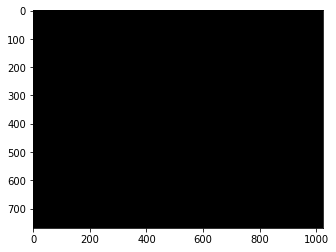

<class 'torch.Tensor'> torch.Size([768, 1024, 3])


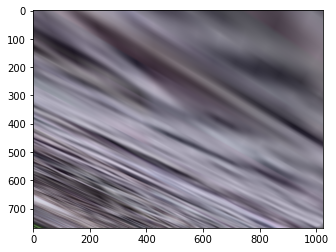

In [53]:
tensor_image_batch_transformed = F.grid_sample(torch.squeeze(tensor_image_batch, dim=2), projected_flow, align_corners=False)
tensor_image_batch_transformed_normalised = F.grid_sample(torch.squeeze(tensor_image_batch, dim=2), projected_flow_normalised, align_corners=False)

img = tensor_image_batch_transformed[0]
print(type(img), img.shape)
img = img.permute(1, 2, 0)

plt.imshow(img.cpu()/255)
plt.show()

img = tensor_image_batch_transformed_normalised[0]
img = img.permute(1, 2, 0)
print(type(img), img.shape)

plt.imshow(img.cpu()/255)
plt.show()

The above codes for 3D transformation, 3D to 2D projection, and sampling images can be implemented into **LRM-STN**. However, we need to double check the alignment of x, y, z coordinates throughout the transformations. 

### Choice of Base Network

The base network can be **LRM-V**, or any other basic regression network.

### Choice of plug-in point

For **LRM-V**, we can plug-in the STN such that it takes the conv4 feature maps (as in the VGG16) as the input, or it takes the orginal image as the input. The output of the STN is a set of sampled points on conv4 feature maps (as in the former) or on original image (as in the latter). The output of STN is then inputted to two sampling processes. One is to sample the feature maps / original image to produce a focused feature maps / image with all spatial transformations undone, referred as f1 in the figure above. The other process is to sample the output of the base network to produce landmark heat maps that have undergone all spatial transformations, referred as f2 in the figure above.

We can also return the output of the sampling process f1 and the input to the sampling process f2 to obtain the estimated true feature maps / image and the estimated true landmark heat maps that are free from any spatial transformations. 

## Experiments

# Option 3: Use DeepFashion landmark branch to provide attention for body landmark prediction

## Inspect the fully trained DeepFashion model parameters

In [ ]:
import torch

statedict = torch.load('models/lmfulltrain.pkl')
for key, value in statedict.items():
  print(key, value.shape)

__step torch.Size([])
vgg16_extractor.vgg.0.weight torch.Size([64, 3, 3, 3])
vgg16_extractor.vgg.0.bias torch.Size([64])
vgg16_extractor.vgg.2.weight torch.Size([64, 64, 3, 3])
vgg16_extractor.vgg.2.bias torch.Size([64])
vgg16_extractor.vgg.5.weight torch.Size([128, 64, 3, 3])
vgg16_extractor.vgg.5.bias torch.Size([128])
vgg16_extractor.vgg.7.weight torch.Size([128, 128, 3, 3])
vgg16_extractor.vgg.7.bias torch.Size([128])
vgg16_extractor.vgg.10.weight torch.Size([256, 128, 3, 3])
vgg16_extractor.vgg.10.bias torch.Size([256])
vgg16_extractor.vgg.12.weight torch.Size([256, 256, 3, 3])
vgg16_extractor.vgg.12.bias torch.Size([256])
vgg16_extractor.vgg.14.weight torch.Size([256, 256, 3, 3])
vgg16_extractor.vgg.14.bias torch.Size([256])
vgg16_extractor.vgg.17.weight torch.Size([512, 256, 3, 3])
vgg16_extractor.vgg.17.bias torch.Size([512])
vgg16_extractor.vgg.19.weight torch.Size([512, 512, 3, 3])
vgg16_extractor.vgg.19.bias torch.Size([512])
vgg16_extractor.vgg.21.weight torch.Size([512, 51

The landmark branch contains the trained parameters for predicting fashion landmarks. There are 10 convolutional layers and 3 upsampling layers.

## Construct the architecture by utilising the whole fashion landmark branch

The architecture of the neural network is as follows.
* Components
  * Feature Extractor (FE)
  * Fashion Landmark Branch (FLB)
  * Body Landmark Branch (BLB)
  * Attention Unit (AU)
* Flow
  * FE-->FLB-->AU-->BLB (output)
  * FE-->BLB
  * FE output and AU output are combined through elementwise multiplication before input to BLB


## Run architecture option 3

In [ ]:
import transfertraining_function_v3 as tff
train_pos_loss, val_pos_loss = tff.starttraining(traincsv='dataset/custlr/auged/train12lm.csv',valcsv='dataset/custlr/auged/val12lm.csv',experiment='custlrexpanded_models/')

training set 8960
val set 2100


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/checkpoints/vgg16-397923af.pth



conv1.weight
conv2.weight
conv3.weight
conv4.weight
upconv1.weight
conv5.weight
conv6.weight
upconv2.weight
conv7.weight
conv8.weight
upconv3.weight
conv9.weight
conv10.weight
LandmarkExpNetwork(
  (vgg16_extractor): VGG16Extractor(
    (vgg): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, k

/content/gdrive/My Drive/Projects/BodyLandmarkDetection/transfertraining_function_v3.py:66: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  torch.nn.init.xavier_uniform(param) #initialise linear weights with Kaiming/Xavier uniform weights
/content/gdrive/My Drive/Projects/BodyLandmarkDetection/transfertraining_function_v3.py:63: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  torch.nn.init.constant(param, 0) # initialise bias with zeros


EPOCH: 1 / 20 step: 1 / 896 | lm position loss: 0.00502115860581398  | weighted loss: 0.0502115860581398
EPOCH: 1 / 20 step: 2 / 896 | lm position loss: 0.004632818046957254  | weighted loss: 0.046328180469572544
EPOCH: 1 / 20 step: 3 / 896 | lm position loss: 0.004563088528811932  | weighted loss: 0.045630885288119316
EPOCH: 1 / 20 step: 4 / 896 | lm position loss: 0.004802873823791742  | weighted loss: 0.04802873823791742
EPOCH: 1 / 20 step: 5 / 896 | lm position loss: 0.003694037441164255  | weighted loss: 0.03694037441164255
EPOCH: 1 / 20 step: 6 / 896 | lm position loss: 0.003971762489527464  | weighted loss: 0.03971762489527464
EPOCH: 1 / 20 step: 7 / 896 | lm position loss: 0.004327617585659027  | weighted loss: 0.04327617585659027
EPOCH: 1 / 20 step: 8 / 896 | lm position loss: 0.004392609000205994  | weighted loss: 0.043926090002059937
EPOCH: 1 / 20 step: 9 / 896 | lm position loss: 0.0038699728902429342  | weighted loss: 0.03869972890242934
EPOCH: 1 / 20 step: 10 / 896 | lm p

KeyboardInterrupt: ignored

In [ ]:
print(train_pos_loss, val_pos_loss)

[0.005015646107494831, 0.004812649451196194, 0.005046810954809189, 0.004812193103134632, 0.005232338327914476, 0.005025226157158613, 0.0050997668877244, 0.005729667376726866, 0.005097493063658476, 0.0046640438959002495, 0.004922453314065933, 0.004621613770723343, 0.004444491118192673, 0.0044988892041146755, 0.004558797925710678, 0.004055873956531286, 0.004205996170639992, 0.003808495821431279, 0.004070027265697718, 0.0038973744958639145, 0.004007628653198481, 0.003956352360546589, 0.0041194213554263115, 0.004035004414618015, 0.0038880426436662674, 0.003944708965718746, 0.003192733973264694, 0.0031969614792615175, 0.003987085074186325, 0.003973557613790035, 0.004112669266760349, 0.004094787407666445, 0.004693410359323025, 0.004885908216238022, 0.0053583174012601376, 0.005145328585058451, 0.004153301473706961, 0.004258277360349894, 0.004298787098377943, 0.004562566988170147, 0.0036693112924695015, 0.004102361388504505, 0.003905536839738488, 0.004400523845106363, 0.003981963265687227, 0.0

## Visualise the results and performance of model option 3

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/

<IPython.core.display.Javascript object>

# **Option 4**

We document the detailed design, implementation, and experiments of several Multi-Scale DCNN models for high resolution body landmark detection.

## Architecture Design

We propose three architecture designs under this design category. 

The first design is a basic retraining of the **Low Resolutoin Model with Attention Unit (LRM-A)** (under **Option 3**) with augmented high resolution images/landmarks. We name it **Vanilla Multi-Scale Model (MSM-V)**. It is feasible because there are only convolutional layers in **LRM-A**. It is not a physical multi-scale architecture.

![LRM-A](https://drive.google.com/uc?export=view&id=16c68y0J9-0I5yL2L1_ZcRMgYLxeO_7pl)


The second design follows what was described under **Option 4** above, the architecture of which was also presented therein. In this design, there are two streams of information flow, one with the low resolution image as input, and the other with high resolution image at input. The low resolution branch loads trained **LRM-A**, and is then frozen, i.e., not trainable. The high resolution branch takes high resolution image as input, goes through feature extraction, and high-resolution landmark detection, which is similar to that of the **Vanilla Low Resolution Model (LRM-V)**. There is also information flow from the output of the **LRM-A** to join the output of the feature extraction block of the high resoltuion branch, which is then inputted to the high resolution landmark detection branch. This connection bewteen the low resolution branch and high resolution branch would provide another attention mechanism for the high resolution branch to focus features on the areas of landmark positions provided by the low resolution branch. This second design is referred to as **Multi-Scale Model with Attention from Low Resolution Landmarks (MSM-A)**. The high resolution branch can be initialised with weights from trained **LRM-A**.

![MSM-A](https://drive.google.com/uc?export=view&id=1U_bpXyTFQPbKSzsy7A54dubF3iYQd5ij)


The third design is similar to the second one (i.e., **MSM-A**), except that we add one more connection bewteen the low resolution branch and the high resolutoin branch. This additional connectoin takes the output of the feature extraction of the low resolution branch and combines it with the features of the high resolution branch before being inputted to the high resolution landmark detection branch. The way of combination can be concatination of features. We name it **Multi-Scale Model with Feature Sharing and Attention (MSM-FA)**.

![MSM-FA](https://drive.google.com/uc?export=view&id=18aU6S_ARg-tjs4MJ0aVYUG5Ya0oJyIUp)


We shall implement the three designs one by one below.

## Implementation Details

### MSM-V

The **MSM-V** adopts the entire architecture of the **LRM-A** but takes high resolution images as the input. 
- *Dataset* We need to prepare training/validation /testing dataset that contains the high resolution images and their corresponding landmarks. As the number of images is only around 100, we have to implement augmentations. 

- *Training* In **LRM-A** there are four components, i.e., (1) VGG16 feature extractor, (2) fashion landmark branch, (3) attention unit, and (4) body landmark branch. To retrain **LRM-A** for high resolution images, we would have to retrain the whole **LRM-A**. However, as the fashion landmarks for Custlr dataset are not available, using only the body landmarks to provide error feedback may not be sufficient and hence may lead to *overfitting*. One possible solution to mitigate this is to re-train the whole network step-wise. 

- *Step-wise Training* As the information flows from (1)-->(2)-->(3)-->(4) and also from (1)-->(4), step-wise training strategy could be as follows.
  1. Freeze (2), (3), (4) and re-train (1)
  2. Freeze (1), (3), (4) and re-train (2)
  3. Freeze (1), (2), (4) and re-train (3)
  4. Freeze (1), (2), (3), and re-train (4)
  5. Repeat 1-4 until stoptting criterior is met.
  
- *Practical Considerations* The stopping criterior could include the number of maximum iterations for step 5, and in the meantime moninorting the convergence of the iterations. The model should be initialised with the trained **LRM-A** model weights. The learning rate should be probably set to a small value such as 0.0001. The number of epochs for each step in 1-4 could be set to a relatively smaller number, such as 5 or 10. 
  
  
  



#### Online augmentation of images/landmarks

Import all necessary modules

In [ ]:
import torch
import time
import pandas as pd
from modelclass_v3 import LandmarkExpNetwork as LMNET
from custlrloader_add_augment_v2 import CustlrDataset
from torch.utils.data import DataLoader
from tensorboardX import SummaryWriter
from matplotlib import pyplot as plt
import src.const as const
from src.utils_v2 import LandmarkEvaluator as _evaluator

Load original training and testing datasets and augment the training dataset.

In [ ]:
traincsv='dataset/custlr/auged/train-ori-12lm.csv'
valcsv='dataset/custlr/auged/test-ori-12lm.csv'
base_path = 'dataset/custlr/auged/'

traindf = pd.read_csv(traincsv)
valdf = pd.read_csv(valcsv)

train_dataset = CustlrDataset(traindf, mode='ORIGINAL', base_path=base_path)
print(train_dataset[0]['image'].shape)
print(len(train_dataset[0]))

torch.Size([3, 4032, 3024])
10


We can see that the original image has 3 channels, the height is 4032, and the width is 3024. We need to pass the height and width to augment the original images.

In [ ]:
image_h, image_w = train_dataset[0]['image'].shape[1:]
#image_w = train_dataset[0]['image'].shape[2]

print(image_h, image_w)

4032 3024


Determine the size of images to be used in the training/testing. Make sure the size are divisible by 16 to avoid errors later.

In [ ]:
resized_image_h = int(image_h/32)*16
resized_image_w = int(image_w/32)*16

In [ ]:
print(resized_image_h, resized_image_w)

2016 1504


Now augment the original images/landmarks.

In [ ]:
train_dataset = []
for td in range(100): # change it to a smaller number (as it crashed with 100)
  #train_dataset.append(CustlrDataset(traindf, mode='FULLAUG', base_path=base_path))
  train_dataset.append(CustlrDataset(traindf, mode='FULLAUG', base_path=base_path, image_w= resized_image_w , image_h=resized_image_h))

print('training set', len(train_dataset)*len(train_dataset[0]))
print(len(train_dataset[0][0]))
print(train_dataset[0][0]['image'].shape)

training set 7900
10
torch.Size([3, 1472, 1472])


Now prepare the validation dataset.

In [ ]:
val_dataset = []
for td in range(100): # change it to a smaller number (as it crashed with 100)
    val_dataset.append(CustlrDataset(valdf, mode='FULLAUG', base_path=base_path, image_w= resized_image_w , image_h=resized_image_h))

print('val set', len(val_dataset)*len(val_dataset[0]))
dssize = len(train_dataset)*len(train_dataset[0]) + len(val_dataset)*len(val_dataset[0])
print(dssize)


val set 2000
9900


Create **MSM_V** model with the similar architure as **LRM-A** model except that the downsample connection from the output of the fashion landmark branch to join the last layer of the VGG16 feature extractor should be modified accordingly. 

In [ ]:
#load empty model
#when load empty model, make sure to set the number of landmark maps as the output channel of the model
lm_body_out_channel = train_dataset[0][0]['landmark_map'].shape[0]
lm_fashion_out_channel = 8 # this can be improved by using the number of output channels in the fashion landmark branch
model = LMNET(lm_fashion_out_channel=lm_fashion_out_channel, lm_body_out_channel=lm_body_out_channel, input_dim=train_dataset[0][0]['image'].shape)

channel_num, image_h, image_w = train_dataset[0][0]['image'].size()
print(channel_num, image_h, image_w)

# set evaluator and device
evaluator = _evaluator(lm_body_out_channel)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

#set training parameters
learning_rate = 0.0001
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
statedict = torch.load('models/Attention from Fashion Landmark Branch_v3_image size 224x224_lr=0.0001_run01.pkl')


3 1472 1472


In [ ]:
print(train_dataset[0][0]['landmark_map'].shape)
print(train_dataset[0][0]['landmark_map28'].shape)
print(train_dataset[0][0]['landmark_map56'].shape)
print(train_dataset[0][0]['landmark_map112'].shape)
print(train_dataset[0][0]['landmark_map224'].shape)

(12, 1472, 1472)
(12, 184, 184)
(12, 368, 368)
(12, 736, 736)
(12, 1472, 1472)


Inspect the empty **MSM-V** model and check the loaded weights from the **LRM-A** model.

In [ ]:
print(model)

LandmarkExpNetwork(
  (vgg16_extractor): VGG16Extractor(
    (vgg): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU

In [ ]:
vgg_output = model.vgg16_extractor(torch.rand(1, *(3, 224, 224)))

In [ ]:
for key, value in vgg_output.items():
  print(key, value.shape)

conv1_1 torch.Size([1, 64, 224, 224])
conv1_2 torch.Size([1, 64, 224, 224])
pooled_1 torch.Size([1, 64, 112, 112])
conv2_1 torch.Size([1, 128, 112, 112])
conv2_2 torch.Size([1, 128, 112, 112])
pooled_2 torch.Size([1, 128, 56, 56])
conv3_1 torch.Size([1, 256, 56, 56])
conv3_2 torch.Size([1, 256, 56, 56])
conv3_3 torch.Size([1, 256, 56, 56])
pooled_3 torch.Size([1, 256, 28, 28])
conv4_1 torch.Size([1, 512, 28, 28])
conv4_2 torch.Size([1, 512, 28, 28])
conv4_3 torch.Size([1, 512, 28, 28])
pooled_4 torch.Size([1, 512, 14, 14])
conv5_1 torch.Size([1, 512, 14, 14])
conv5_2 torch.Size([1, 512, 14, 14])
conv5_3 torch.Size([1, 512, 14, 14])
pooled_5 torch.Size([1, 512, 7, 7])


Initialise the weights of **MSM-V** model with the weights of trained **LRM-A** model.

In [ ]:
model.load_state_dict(statedict)

<All keys matched successfully>

In [ ]:
    for child_name, child in model.named_children():
        if child_name == 'vgg16_extractor':
            for para_name, param in child.named_parameters():
                param = statedict[child_name + '.'+ para_name]
                param.requires_grad = False
        elif child_name == 'lm_fashion_branch':
            for para_name, param in child.named_parameters():
                param = statedict['lm_fashion_branch' + '.'+ para_name]
                param.requires_grad = False
        elif child_name == 'lm_body_branch': # this left other parts of the neural network initialised by default settings
        #else: # for lm_body_branch & attention_pred_net
            for para_name, param in child.named_parameters():
                if 'bias' in para_name:
                    torch.nn.init.constant(param, 0) # initialise bias with zeros
                else:
                    print(para_name)
                    torch.nn.init.xavier_uniform(param) #initialise linear weights with Kaiming/Xavier uniform weights

conv1.weight
conv2.weight
conv3.weight
conv4.weight
upconv1.weight
conv5.weight
conv6.weight
upconv2.weight
conv7.weight
conv8.weight
upconv3.weight
conv9.weight
conv10.weight


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  


Set the log files

In [ ]:
model.to(device)
logname = time.strftime('%m-%d %H:%M:%S', time.localtime())
logname = logname + 'MSM-V_run_01'
logname = 'runs/' + logname
writer = SummaryWriter(logname)


Now that we have created the training and validation dataset of original resolution, we proceed to creat dataloader and training process. 

In [ ]:
trainloader = []
for td in train_dataset:
  trainloader.append(DataLoader(td, batch_size=2, shuffle=True, num_workers=4)) # change to a smaller number of batch_size since 10 caused crash
    
valloader = []
for vd in val_dataset:
  valloader.append(DataLoader(vd, batch_size=2, shuffle=True, num_workers=4)) # change to a smaller number of batch_size since 10 caused crash

Now start the training process.

In [ ]:
    train_pos_loss = []
    val_pos_loss = []
    NUMEPOCH = 20
    NUMSTEP = len(trainloader)
    step = 0
    for epoch in range(NUMEPOCH):
        for stat in ['train','val']:
            print(stat)
            if stat == 'train':
                model.train()
                for i, td in enumerate(trainloader):
                    NUMSTEP = len(trainloader)*len(td)
                    k = 0
                    for sample in td:
                        k += 1
                        step += 1
                        for key in sample:
                            sample[key] = sample[key].to(device)
                        output = model(sample)
                        #print('Output: ', output['lm_pos_map'].shape)
                                                
                        loss = model.cal_loss(sample, output)
                        
                        optimizer.zero_grad()
                        loss['all'].backward()
                        optimizer.step()
                        
                        if 'lm_vis_loss' in loss:
                            writer.add_scalar('loss/lm_vis_loss', loss['lm_vis_loss'], step)
                            writer.add_scalar('loss_weighted/lm_vis_loss', loss['weighted_lm_vis_loss'], step)
                        if 'lm_pos_loss' in loss:
                            writer.add_scalar('loss/lm_pos_loss', loss['lm_pos_loss'], step)
                            writer.add_scalar('loss_weighted/lm_pos_loss', loss['weighted_lm_pos_loss'], step)
                        writer.add_scalar('loss_weighted/all', loss['all'], step)
                        writer.add_scalar('global/learning_rate', learning_rate, step)
                        
                        train_pos_loss.append(loss['lm_pos_loss'])
                        print('EPOCH:', epoch+1,'/',NUMEPOCH,'step:', i*len(td)+k,'/',NUMSTEP,'| lm position loss:', loss['lm_pos_loss'],' | weighted loss:', loss['weighted_lm_pos_loss'])
            else:
                model.eval()
                for i, vd in enumerate(valloader):
                  for sample in vd:
                    step += 1
                    for key in sample:
                      sample[key] = sample[key].to(device)
                    output = model(sample)
                    evaluator.add(output, sample)
                ret = evaluator.evaluate()
                for i in range(lm_body_out_channel):
                    print('metrics/dist_part_{}_{}'.format(i, const.lm2name[i]), ret['lm_individual_dist'][i])
                    writer.add_scalar('metrics/dist_part_{}_{}'.format(i, const.lm2name[i]), ret['lm_individual_dist'][i], step)
                print('metrics/dist_all', ret['lm_dist'])
                writer.add_scalar('metrics/dist_all', ret['lm_dist'], step)
                val_pos_loss.append(ret['lm_dist'])
                print('EPOCH:', epoch+1,'/',NUMEPOCH,'| lm distance:', ret['lm_dist'])
                model.train()
        learning_rate *= const.LEARNING_RATE_DECAY
        optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)


Save the trained **MSM-V** model.

In [ ]:
    torch.save(model.state_dict(), 'models/'+ 'MSM-V' + 'image size ' + str(image_h) + 'x' + str(image_w) +'.pkl')
    plt.plot(train_pos_loss,label='training pos loss')
    #tfigname = 'experimentlayersgraph/training loss'+str(trainstartparam)+'-51'+' dataset '+str(dssize) +'.png'
    #plt.savefig(tfigname)
    plt.show()
    plt.plot(val_pos_loss,label='validation pos loss')
    #vfigname = 'experimentlayersgraph/val loss'+str(trainstartparam)+'-51'+' dataset '+str(dssize) +'.png'
    #plt.savefig(vfigname)
    plt.show()


#### Put everything in one file and run it.

In [ ]:
import transfertraining_function_v4_MSM_V as tff
tff.starttraining(traincsv='dataset/custlr/auged/train-ori-12lm.csv',valcsv='dataset/custlr/auged/test-ori-12lm.csv')

torch.Size([3, 4032, 3024])
10
2016 1504
training set 7900
10
torch.Size([3, 1472, 1472])
val set 2000
9900
3 1472 1472
train
EPOCH: 1 / 20 step: 1 / 4000 | lm position loss: 0.00017978897085413337  | weighted loss: 0.0017978897085413337
EPOCH: 1 / 20 step: 1 / 4000 | lm position loss: 0.00013462449715007097  | weighted loss: 0.0013462449715007097
EPOCH: 1 / 20 step: 1 / 4000 | lm position loss: 0.00013297481928020716  | weighted loss: 0.0013297481928020716
EPOCH: 1 / 20 step: 1 / 4000 | lm position loss: 0.00012447047629393637  | weighted loss: 0.0012447047629393637
EPOCH: 1 / 20 step: 1 / 4000 | lm position loss: 0.00015435725799761713  | weighted loss: 0.0015435725799761713
EPOCH: 1 / 20 step: 1 / 4000 | lm position loss: 0.0001519780926173553  | weighted loss: 0.0015197809261735529
EPOCH: 1 / 20 step: 1 / 4000 | lm position loss: 0.000161649557412602  | weighted loss: 0.00161649557412602
EPOCH: 1 / 20 step: 1 / 4000 | lm position loss: 0.00015450730279553682  | weighted loss: 0.001

KeyboardInterrupt: ignored

### MSM-A

For the convenience of discussions, we show the **MSM-A** architecture below again.

![MSM-A](https://drive.google.com/uc?export=view&id=1U_bpXyTFQPbKSzsy7A54dubF3iYQd5ij)

- *Dataset* For each sample in the dataset, we have two versions for it, the original high resolution image and its corresponding landmarks, and its low resolution image and corresponding landmarks. 

- *Training Strategies* 
  1. Load the trained **LRM-A** model weights for the low resolution branch and freeze it. And
    (a) randomly initialise the high resolution branch and retrain, or
    (b) initialise the high resolution branch with the trained **LRM-A** model weights and retrain, or
    (c) initialise the high resolution branch with the trained **MSM-V** model weights and retrain.

  2. Load the trained **LRM-A** model weights for the low resolution branch and freeze the feature extraction and fashion landmark branch only. And 
    (a) randomly initialise the rest and retrain, or
    (b) initialise the rest of the trained **LRM-A** model weights and retrain, or
    (c) initialise the rest of the low resolution branch with the trained **LRM-A** model weights, and initialise the high resolution branch with the trained **MSM-V** model weights, and re-train.

#### Run MSM-A model

In [ ]:
import transfertraining_function_v4_MSM_A as tff
tff.starttraining(traincsv='dataset/custlr/auged/train-ori-12lm.csv',valcsv='dataset/custlr/auged/test-ori-12lm.csv')

torch.Size([3, 4032, 3024])
10
2016 1504
training set 7900
20
torch.Size([3, 1472, 1472])
val set 2000
9900


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/checkpoints/vgg16-397923af.pth



3 1472 1472
vgg.0.weight
vgg.2.weight
vgg.5.weight
vgg.7.weight
vgg.10.weight
vgg.12.weight
vgg.14.weight
vgg.17.weight
vgg.19.weight
vgg.21.weight
vgg.24.weight
vgg.26.weight
vgg.28.weight
conv1.weight
conv2.weight
conv3.weight
conv4.weight
upconv1.weight
conv5.weight
conv6.weight
upconv2.weight
conv7.weight
conv8.weight
upconv3.weight
conv9.weight
conv10.weight
train


/content/gdrive/My Drive/Projects/BodyLandmarkDetection/transfertraining_function_v4_MSM_A.py:81: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  torch.nn.init.xavier_uniform(param) #initialise linear weights with Kaiming/Xavier uniform weights
/content/gdrive/My Drive/Projects/BodyLandmarkDetection/transfertraining_function_v4_MSM_A.py:78: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  torch.nn.init.constant(param, 0) # initialise bias with zeros


EPOCH: 1 / 20 step: 1 / 4000 | lm position loss: 0.0001312543172389269  | weighted loss: 0.0013125431723892689
EPOCH: 1 / 20 step: 2 / 4000 | lm position loss: 0.0001466785033699125  | weighted loss: 0.001466785033699125
EPOCH: 1 / 20 step: 3 / 4000 | lm position loss: 0.00014629315410275012  | weighted loss: 0.0014629315410275012
EPOCH: 1 / 20 step: 4 / 4000 | lm position loss: 0.00014358478074427694  | weighted loss: 0.0014358478074427694
EPOCH: 1 / 20 step: 5 / 4000 | lm position loss: 0.00016132915334310383  | weighted loss: 0.0016132915334310383
EPOCH: 1 / 20 step: 6 / 4000 | lm position loss: 0.00014459794329013675  | weighted loss: 0.0014459794329013675
EPOCH: 1 / 20 step: 7 / 4000 | lm position loss: 0.00013880729966331273  | weighted loss: 0.0013880729966331273
EPOCH: 1 / 20 step: 8 / 4000 | lm position loss: 0.00013880118785891682  | weighted loss: 0.0013880118785891682
EPOCH: 1 / 20 step: 9 / 4000 | lm position loss: 0.00015420281852129847  | weighted loss: 0.001542028185212

KeyboardInterrupt: ignored

### MSM-FA

For the convenience of discussions, we show the **MSM-FA** architecture below again.

![MSM-FA](https://drive.google.com/uc?export=view&id=18aU6S_ARg-tjs4MJ0aVYUG5Ya0oJyIUp)

- *Dataset* For each sample in the dataset, we have two versions for it, the original high resolution image and its corresponding landmarks, and its low resolution image and corresponding landmarks.

- *Training Strategies* The training strategies follow the ones for training **MSM-A** model. Note that there are several upsampling layers from the low resolution branch to the high resolution branch. These upsampling layers can be designed to be also trainable. However, at the moment, they are just upsampling layers and not trainable. The ones connecting from the feature extractor in the low resolution branch to the feature extractor in the high resolution branch are to be randomly initialised. The one connecting from the low resolution landmark output to the attention unit can be either randomaly initialised or load the AU weights in the **LRM-A** model and then retrain. 

#### Run MSM-FA model

In [ ]:
import transfertraining_function_v4_MSM_FA as tff
tff.starttraining(traincsv='dataset/custlr/auged/train-ori-12lm.csv',valcsv='dataset/custlr/auged/test-ori-12lm.csv',model_name='MSM-FA')

torch.Size([3, 4032, 3024])
10
2016 1504
training set 7900
20
torch.Size([3, 1472, 1472])
val set 2000
9900
3 1472 1472
conv1_1.weight
conv1_2.weight
conv2_1.weight
conv2_2.weight
conv3_1.weight
conv3_2.weight
conv3_3.weight
conv4_1.weight
conv4_2.weight
conv4_3.weight
conv5_1.weight
conv5_2.weight
conv5_3.weight
conv1.weight
conv2.weight
conv3.weight
conv4.weight
upconv1.weight
conv5.weight
conv6.weight
upconv2.weight
conv7.weight
conv8.weight
upconv3.weight
conv9.weight
conv10.weight
train


/content/gdrive/My Drive/Projects/BodyLandmarkDetection/transfertraining_function_v4_MSM_FA.py:82: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  torch.nn.init.xavier_uniform(param) #initialise linear weights with Kaiming/Xavier uniform weights
/content/gdrive/My Drive/Projects/BodyLandmarkDetection/transfertraining_function_v4_MSM_FA.py:79: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  torch.nn.init.constant(param, 0) # initialise bias with zeros


AttributeError: ignored

## Experiments

asfa

# Visualising Graph

## An example

In [ ]:
import torch
from torch.autograd import Variable
from torchvision import models
from torchviz import make_dot

inputs = torch.randn(1,3,224,224)
resnet18 = models.resnet18()
y = resnet18(Variable(inputs))
# print(y)

g = make_dot(y)
g.view()

'Digraph.gv.pdf'